In [22]:
import os
from typing import Dict

import numpy as np
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go
from matplotlib import pyplot as plt

In [3]:
py.init_notebook_mode(connected=True)

In [4]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 9]

In [5]:
def process_profitchart_data(df):
    _df = df.copy()

    _df['datetime'] = _df['Data'] + ' ' + _df['Hora']
    _df.index = pd.to_datetime(_df['datetime'], format='%d/%m/%Y %H:%M:%S').values

    _df = _df.drop(['Data', 'Hora', 'datetime', 'Ativo', 'Quantidade'], axis=1)

    _df = _df.rename(columns={
        'Abertura': 'open',
        'Máximo': 'high',
        'Mínimo': 'low',
        'Fechamento': 'close',
        'Volume': 'volume',
    })

    _df = _df.applymap(lambda value: value.replace('.', '').replace(',', '.')).astype(float)
    _df = _df.sort_index()
    
    return _df

In [6]:
dolfut_1 = pd.read_csv('data/dados_dolfut/DOLFUT_1min.csv', sep=';', encoding='latin1', dtype=str)
indfut_1 = pd.read_csv('data/dados_indfut/INDFUT_1min.csv', sep=';', encoding='latin1', dtype=str)

dolfut_1 = process_profitchart_data(dolfut_1)['2019-04':]
indfut_1 = process_profitchart_data(indfut_1)['2019-04':]

## Bollinger Bands
The formulas for constructing the bands is, typically:

$$TP = \frac{(High + Low + Close)}{3}$$
$$BB_{upper} = MA(TP, n) + m * \sigma[TP, n]$$
$$BB_{lower} = MA(TP, n) - m * \sigma[TP, n]$$

where

$BB =$ Bollinger Band

$MA(X, k) =$ Moving Average of signal X over last k periods

$\sigma[X, k] =$ Standard Deviation of signal X over last k periods

$n =$ number of periods to consider

$m =$ number of standard deviations to offset the bands by

In [7]:
class BollingerBands:
    def __init__(self, quotes, num_periods, deviations, long_periods=60):
        assert isinstance(quotes, pd.DataFrame), "Quotes object should be a DataFrame."
        
        self.num_periods = num_periods
        self.deviations = deviations
        self.long_periods = long_periods
        self.quotes = self._construct_bands(quotes)
        self.signals = self._make_signals()
        
    def _construct_bands(self, quotes):
        # Standard Bolling Bands Algorithm
        quotes['TP'] = quotes.eval("(high + low + close) / 3")
        
        quotes['std_dev'] = quotes['TP'].rolling(self.num_periods).std()
        
        quotes['band_center'] = quotes['TP'].rolling(self.num_periods).mean()
        quotes['band_upper'] = quotes['band_center'] + self.deviations * quotes['std_dev']
        quotes['band_lower'] = quotes['band_center'] - self.deviations * quotes['std_dev']
        
        # Long term rolling standard deviation, used to evaluate "consolidation periods".
        quotes['long_term_std'] = quotes['TP'].rolling(self.long_periods).std()
        
        return quotes
    
    def _make_signals(self):
        quotes = self.quotes.copy()
        
        quotes['signal_short'] = quotes.eval('high >= band_upper').astype(int)
        quotes['signal_long'] = quotes.eval('low <= band_lower').astype(int)
        
        # In practice, this only has an impact in very high volatility situations.
        # In those situations, it might be relevant not to trade at all, as we don't have a good
        # estimate of in which direction the market "will move"
        quotes['signal'] = quotes['signal_long'] - quotes['signal_short']
        
        return quotes['signal']
    
    def plot_candlesticks(self, last=60):
        quotes = self.quotes
        
        candles = go.Candlestick(
            x=quotes.index,
            open=quotes['open'],
            high=quotes['high'],
            low=quotes['low'],
            close=quotes['close']
        )
        
        layout = {
            "showlegend": False,
            "xaxis": {
                "autorange": True, 
                "domain": [0, 1], 
                "range": [quotes.index.min(), quotes.index.max()], 
                "rangeslider": {"range": [quotes.index.min(), quotes.index.max()]}, 
                "title": 'Date',
                "type": 'category', 
                "categoryorder": 'category ascending'
            }, 
            "yaxis": {
                "autorange": "visible",
                "domain": [0, 1], 
                "type": 'linear'
            }
            
        }
        
        data = [candles]
        
        fig = {'data': data, 'layout': layout}
        
        py.iplot(data, filename='bova_test')

In [8]:
df = pd.DataFrame(columns=['asset', 'datetime', 'quantity', 'value'])

In [21]:
df.append({
    'asset': 'bova11',
    'datetime': '2019-05-31 12:32:00',
    'quantity': 100,
    'value': 92.32
}, ignore_index=True)

,asset,datetime,quantity,value
0,bova11,2019-05-31 12:32:00,100,92.32


In [17]:
pd.DataFrame(data=[['bova11', '2019-05-31 12:32:00', '100', 91.32]], columns=['asset', 'datetime', 'quantity', 'value'])

,asset,datetime,quantity,value
0,bova11,2019-05-31 12:32:00,100,91.32


In [18]:
pd.concat([df, pd.DataFrame([['bova11', '2019-05-31 12:32:00', '100', 91.32]], columns=['asset', 'datetime', 'quantity', 'value'])])

,asset,datetime,quantity,value
0,bova11,2019-05-31 12:32:00,100,91.32


In [46]:
class Ledger:
    def __init__(self, cash, assets=None, transactions=None):
        self.available_cash = cash
        self.transaction_history = pd.DataFrame(columns=['asset', 'datetime', 'quantity', 'value', 'direction'])
        
    def register_transaction(self, transaction):
        assert isinstance(transaction, Dict), "The transaction to append should be a dictionary."
        
        history = self.transaction_history
        canon_cols = history.columns.tolist()
        assert list(transaction.keys()) == canon_cols, f"New transactions should have these columns: {canon_cols}"
        
        self.transaction_history = history.append(transaction, ignore_index=True)
        self._update_available_cash(transaction)
        
    def _update_available_cash(self, transaction):
        cash = self.available_cash
        if transaction['direction'] == 'sell':
            cash = cash + transaction['value']
        elif transaction['direction'] == 'buy':
            cash = cash + transaction['value']
        else:
            raise ValueError(f"The direction of a transaction should be 'sell' or 'buy'. Got {transaction['value']}.")            

In [48]:
ledger = Ledger(1000)

In [50]:
ledger.register_transaction({'asset': 'bla', 'datetime': 'bla', 'quantity': 'bla', 'value': 'bla', 'direction':'bla'})

ValueError: The direction of a transaction should be 'sell' or 'buy'. Got bla.

In [9]:
class Portfolio:
    def __init__(self, initial_cash):
        self.initial_cash = initial_cash
        self.ledger = Ledger(self.initial_cash, assets=None, transactions=None)
        
    def place_order(self, asset, direction, price):
        pass
    
    def _register_transaction(self, order):
        pass

    def _evaluate_trading_asset(self, asset):
        pass

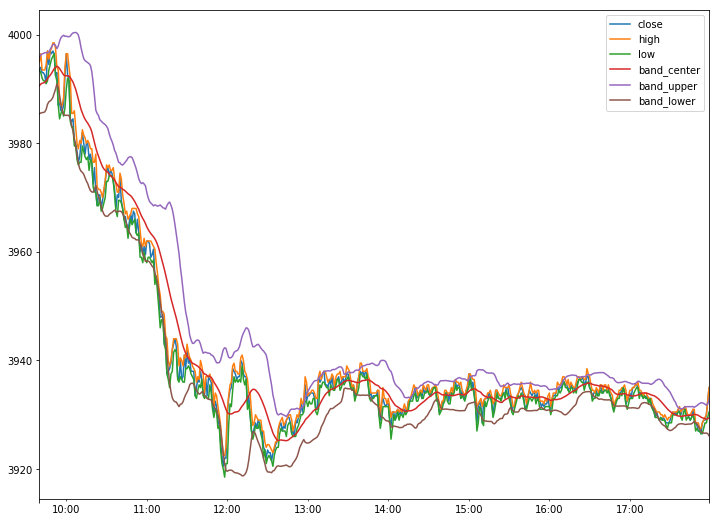

In [10]:
dol_bands = BollingerBands(dolfut_proc, 20, 2)
dol_bands.quotes[['close', 'high', 'low', 'band_center', 'band_upper', 'band_lower']].iloc[-500:].plot()

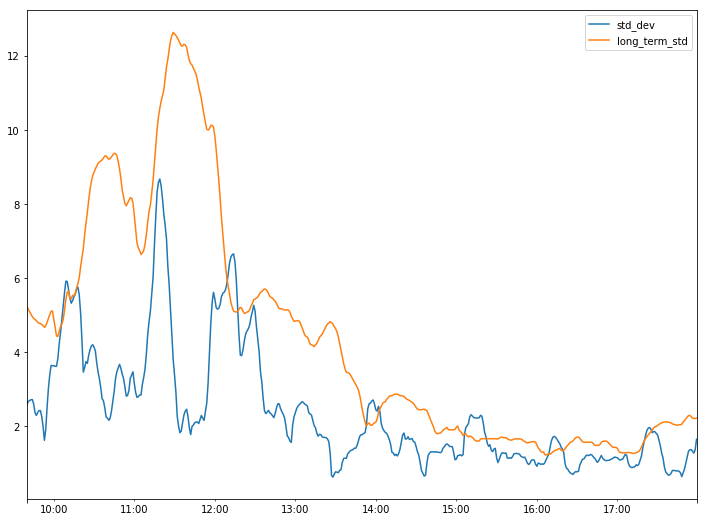

In [11]:
dol_bands.quotes[['std_dev', 'long_term_std']].iloc[-500:].plot()

<StemContainer object of 3 artists>

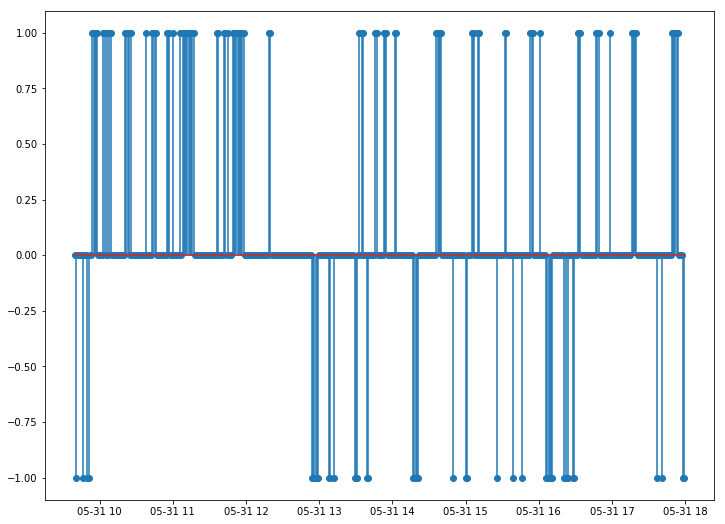

In [12]:
plt.stem(dol_bands.signals.iloc[-500:].index, dol_bands.signals.iloc[-500:].values)

In [13]:
dol_bands.plot_candlesticks()